# Practical work on SAR synthesis
 
### Florence TUPIN, Emanuele DALSASSO

Images of the practical work can be found on: 
https://perso.telecom-paristech.fr/dalsasso/TPSAR/

You have:
- Terrasar-X images of metric resolution on Grand canyon in Colorado. 
- Terrasar-X image of Paris
- ERS-1 image of Lausanne 

Some useful functions are available in the file *mvalab.py*.

### Name: Marine MERCIER

#### Instructions

To solve this practical session, answer the questions below. Then export the notebook with the answers using the menu option **File -> Download as -> Notebook (.ipynb)**. Then [submit the resulting file here](https://partage.imt.fr/index.php/s/Xj2A3MGLpcDZoxE) by next week.

### Reading of images with TélécomParis format
A useful function to read the images with Télécom-Paris format is *imz2mat*

### First step: install needed packages 
In this and the following practical works, we are going to need
- numpy: a fundamental package for scientific computing with Python
- matplotlib: a Python 2D plotting library
- scipy: library for numerical integration, interpolation, optimization, linear algebra and statistics.

## Introduction
### Complex images 
SAR images are usually complex data. Here are some useful `numpy` functions: 
- to take the conjugate: `np.conj`
- to take the absolute value: `np.abs`
- to take the real part: `np.real` or `spy.real`
- to take the imaginary part: `np.imag` or `spy.imag`
- yo take the phase: `np.angle`. Value is between −π and +π.


### Fourier transfrom of an image

Python computes the Fourier transform of a 2D signal (matrix  Z) thanks to the package `np.fft`.
- `np.fft.fft2` is the basic procedure. From a real image (2D array of real numbers), it returns a matrix of complex numbers.
Be careful, the spectrum is given between 0 and 1 (in normalized frequency. To convert it between -0.5 and 0.5, you have to use `np.fft.fftshift` to center the spectrum.
- `np.fft.ifft2` gives the 2D inverse Fourier transform.
Be careful `np.fft.ifft2` usually gives a result with complex values even if the enter is a real matrix.
- Do not forget that a spectrum is complex values. To visualize it,`np.abs` transforms a complex matrix to a real matrix.

### Convolution
- `np.convolve(vector, mask, mode='same')`: 1D convolution keeping the original vector size
- `scipy.signal.convolve2d(image, mask, mode='same')`: 2D convolution keeping the orignal image size

### Import the libraries and packages we are going to use
The following cell imports all that is going to be necessary for the practical work

In [1]:
!wget https://perso.telecom-paristech.fr/dalsasso/TPSAR/mvalab.py

--2022-01-30 23:37:37--  https://perso.telecom-paristech.fr/dalsasso/TPSAR/mvalab.py
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68071 (66K) [text/x-python]
Saving to: ‘mvalab.py’

mvalab.py           100%[===================>]  66.48K  --.-KB/s    in 0.02s   

2022-01-30 23:37:37 (3.81 MB/s) - ‘mvalab.py’ saved [68071/68071]



In [2]:
import math
import numpy as np
import scipy as spy
import scipy.fftpack 
import scipy.signal
import scipy
from scipy import ndimage
import matplotlib.pyplot as plt
import mvalab as mvalab
from urllib.request import urlopen

plt.rcParams['figure.figsize'] = [9, 9]

### SAR Images 
To read an image use {mvalab.imz2mat} with input parameter the image name (or url). 
It returns a list with a table of complex numbers, the number of columns and the number of lines.

In [3]:
url='https://perso.telecom-paristech.fr/dalsasso/TPSAR/imagesbase/'

image_name='coloradoDP.CXF'
data=mvalab.imz2mat(url+image_name)
image_slc=data[0] # single-look complex image
ncol=data[1] # number of columns
nlin=data[2] # number of lines
print(ncol)
print(nlin)


imz2mat : version janvier 2018.  Fichier à ouvrir : https://perso.telecom-paristech.fr/dalsasso/TPSAR/imagesbase/coloradoDP.CXF
Nom compatible url
Nom compatible url
Complex float, Fichiers PC
INFO - reading header/dim : https://perso.telecom-paristech.fr/dalsasso/TPSAR/imagesbase/coloradoDP.dim
lecture .dim OK -> largeur:2048 hauteur:2048 profondeur:1
Debug 2 4 2048
4 2048 <f
2048
2048


### Visualizing SAR data 
Visualize the amplitude and phase of the complex backscattered electro-magnetic field
on Grand Canyon image.
When just using imshow the full dynamic of the image is linearly converted to [0,255].
When using mvalab.visusar, a threshold is defined as follows:
$$
\text{threshold} = \mu+k\times \sigma
$$ 
where $\mu$ is the image mean and $\sigma$ is the image standard deviation. This way, only values between 0 and the threshold are displayed (values above the threshold are saturated at 255).
A usual value of k is 3 (default value).


Affichage d'une image reelle
plt.show dans visusar : image 2048 x 2048


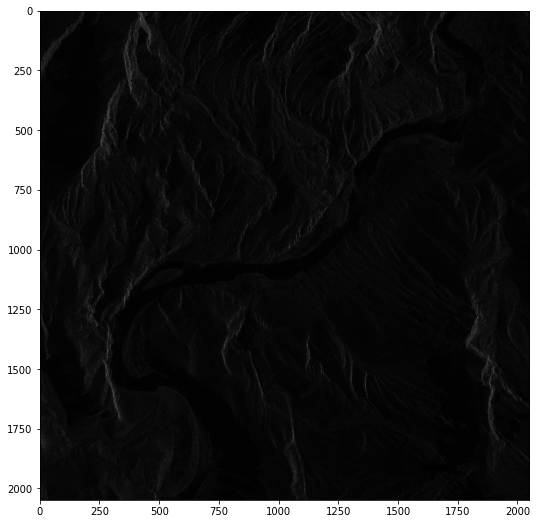

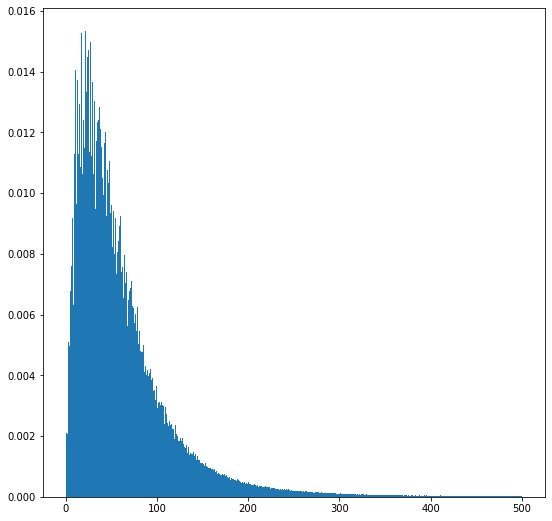

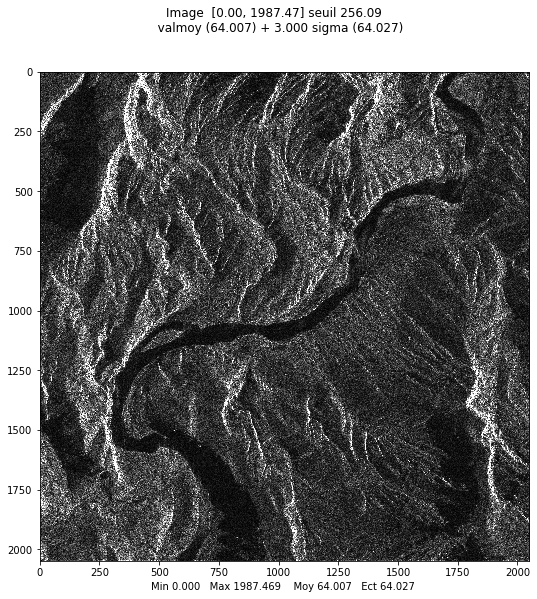

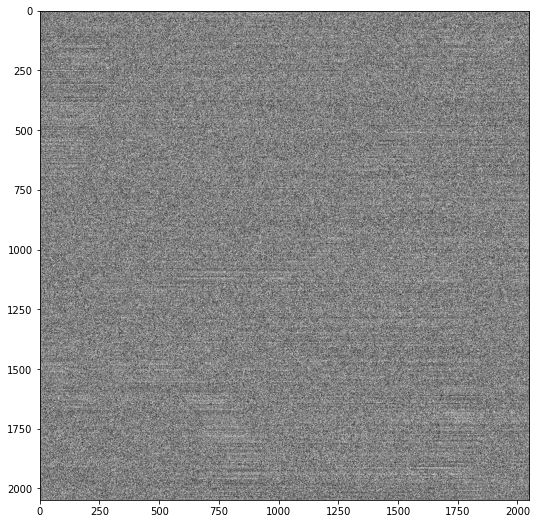

In [4]:
#visualization of amplitude data 
image_amplitude = np.abs(image_slc) # COMPLETE to compute the amplitude image
plt.figure()
plt.imshow(image_amplitude, cmap='gray') # COMPLETE to visualize the amplitude image

plt.figure()
plt.hist(image_amplitude.ravel(),density=True, bins='auto',range=[0., 500.])

#mvalab.visusar uses a threshold th=mean+k*sigma to stretch the dynamic
#two inpu parameters : table of pixels (absolute value) and k value to define the threshold
k = 3 # COMPLETE
mvalab.visusar(image_amplitude,k) # COMPLETE to visualize the amplitude image with threhsolding

#visualization of phase data 
image_phase = np.angle(image_slc) # COMPLETE to compute the phase
plt.figure()
plt.imshow(image_phase+np.pi)


### Question 1.a
Explain what you see in the different images of Colorado acquisition and the role of the $k$ value.
Give an interpretation of the amplitude image (which areas do you recognize) 
and of the phase image.

#### Answer 1.a

When you just print the amplitude, the dynamic range of the image is very dark. There are a few very bright spots on top of the mountains, but the image is difficult to interpret.

By using mvalab and a threshold, we saturate the very bright points to 255, which allows us to rebalance the dynamics of the image. Thanks to this transformation, we can better observe the smooth areas such as the river and we can distinguish the mountains.

k defines the dynamic range of the image, because the larger k is, the higher the threshold, so the darker the image. On the contrary, a too small k risks to make the image too clear because many values will be saturated at 255, we would lose information.

The phase image looks like blank noise.


## Part 1: Analysis of a SAR image 
In this part we will use an image of TerraSAR-X sensor (metric resolution) of Paris. 
Check that you recognize the main buildings on this image. 

In [5]:
url='https://perso.telecom-paristech.fr/dalsasso/TPSAR/paris/'

image_name='Eiffel.CXF'
data_paris=mvalab.imz2mat(url+image_name)
ncol=data_paris[1]
nlin=data_paris[2]

image_slc_paris = data_paris[0]

imz2mat : version janvier 2018.  Fichier à ouvrir : https://perso.telecom-paristech.fr/dalsasso/TPSAR/paris/Eiffel.CXF
Nom compatible url
Nom compatible url
Complex float, Fichiers PC
INFO - reading header/dim : https://perso.telecom-paristech.fr/dalsasso/TPSAR/paris/Eiffel.dim
lecture .dim OK -> largeur:2048 hauteur:2048 profondeur:1
Debug 2 4 2048
4 2048 <f


Affichage d'une image reelle
plt.show dans visusar : image 2048 x 2048


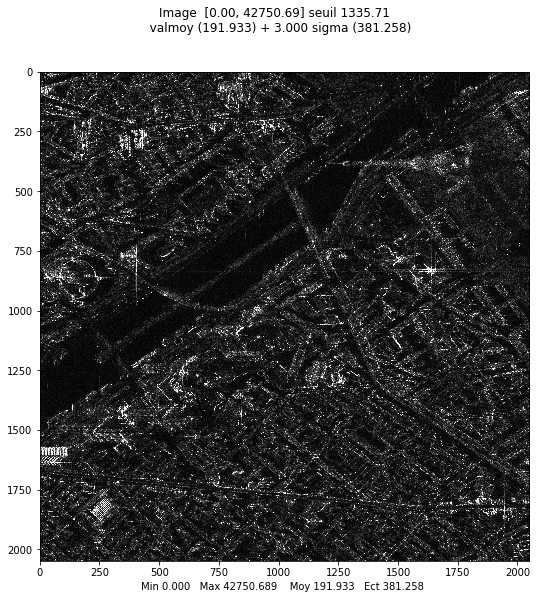

Affichage d'une image reelle
plt.show dans visusar : image 2048 x 2048


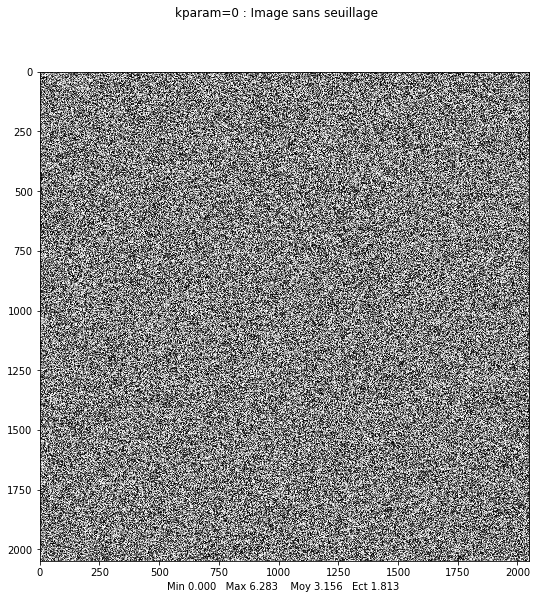

array([[2.96173915, 0.13432144, 1.07144961, ..., 0.47934139, 6.25899648,
        5.67245934],
       [3.14159265, 3.14159265, 3.14159265, ..., 3.14159265, 3.14159265,
        3.14159265],
       [3.14159265, 3.14159265, 3.14159265, ..., 3.14159265, 3.14159265,
        3.14159265],
       ...,
       [1.2722974 , 2.98727388, 1.96856718, ..., 1.17692772, 0.31865459,
        5.09289536],
       [0.40890783, 3.42853141, 3.59631193, ..., 4.77480779, 3.19282982,
        3.6149487 ],
       [5.13061331, 1.77255867, 0.89213384, ..., 2.8691295 , 1.18247761,
        1.63321514]])

In [6]:
plt.rcParams['figure.figsize'] = [9, 9]
image_amplitude_paris = np.abs(image_slc_paris)
image_phase_paris = np.angle(image_slc_paris)
mvalab.visusar(image_amplitude_paris)
mvalab.visusar(image_phase_paris+math.pi,0.)

### Analysis of a subpart of the image 
Choose a sub-part of the image and visualize the amplitude image

Affichage d'une image reelle
plt.show dans visusar : image 1000 x 350


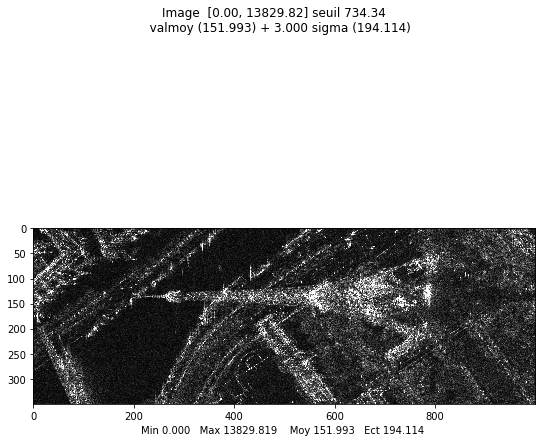

array([[ 43.829214  ,  22.8035085 ,   9.89949494, ..., 122.44998979,
        144.06248644,  71.1758386 ],
       [ 56.08029957,  91.5259526 ,  33.95585369, ...,  57.5847202 ,
         66.28725368,  54.70831747],
       [ 55.56977596,  53.16013544,  49.        , ...,  43.96589587,
         90.44335244,  87.2811549 ],
       ...,
       [ 67.23094526,  14.2126704 ,  23.76972865, ..., 124.45481108,
        109.12378293,  80.62257748],
       [ 96.46242792,  64.49806199,  13.15294644, ..., 120.76837334,
        102.4890238 , 123.08127396],
       [ 64.51356447,  55.54277631,  32.984845  , ..., 189.33568074,
         42.04759208,  63.34824386]])

In [7]:
image_crop_paris = image_amplitude_paris[250:600,1000:2000]
mvalab.visusar(image_crop_paris)

The top of the Eiffel Tower is the first point reflected (Closest Point...)

### Question 1.b

Explain where is the sensor relatively to the scene.

Explain the appearence of the following buildings in the amplitude image : Eiffel Tower, Maison de la radio, Pont de Bir-Hakeim (you can use a [satellite optic image on googlemaps](https://www.google.com/maps/place/Eiffel+Tower/@48.851143,2.2797819,447m/data=!3m1!1e3!4m5!3m4!1s0x47e66e2964e34e2d:0x8ddca9ee380ef7e0!8m2!3d48.8583701!4d2.2944813) to help you).

Explain the appearence of water and vegetated areas.

### Answer 1.b

The wave is diffused in different direction, hence the very shiny aspect of the corners (for example on the Eiffel Tower, or the Maison de la radio). On the contrary the Seine is dark, because it is smooth. The strustures in the corners reflect the electromagnetic wave a lot.

It seems that the sensor is located on the left of the image, rather at the top. Indeed, the very large buildings such as the Eiffel Tower are folded to the left, towards the direction of the sensor.


### Spectral analysis 
Plot the modulus of complex spectrum of the image and the modulus of the Fourier transform of the image taken in amplitude. 

Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre
Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre


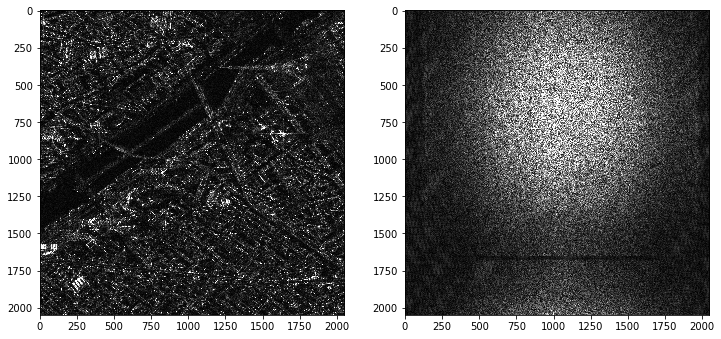

Affichage d'une image reelle
Visusar sans plt.show, ni titre
Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre


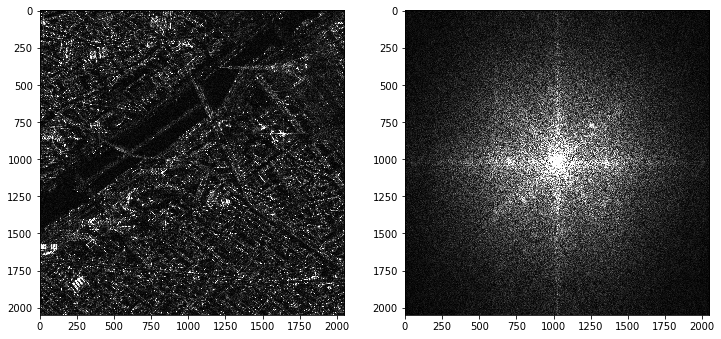

In [8]:
# SPECTRAL ANALYSIS mvalab.visusarspectre: plot the image and its Fourier spectrum
mvalab.visusarspectre(image_slc_paris) # COMPLETE to visualize the complex spectrum 
mvalab.visusarspectre(image_amplitude_paris) # COMPLETE to visualize the image spectrum #modulus of the Fourier transform

### Question 1.c

Explain what you see in the Fourier spectrum of the complex image. How are the two axis related to the SAR image synthesis ?

Explain what you see in the Fourier spectrum of the amplitude image.

### Answer 1.c

The spectrum of the image modulus gives information about the phase used for impulsion compression and for aperture synthesis. In the horizontal direction, the frequencies are related to the emitted chirp, while in the azimuthal direction the frequencies are related to the aperture synthesis.
 The Fourier transform of the amplitude spectrum is similar to that of natural images, which can be easily interpreted.  We can see the main axes of the image such as the main boulevards. The objects are perpendicular to the linear structure that can be seen on the transform. We see that there is also folding between the images, hence the appearance of a horizontal and vertical cross.


## Part 2: SAR synthesis using SAR RAW data 
To study the SAR synthesis we will use a ERS-1 SAR image which is provided by ESA in "raw" format. 
It means that it corresponds to the image before the chirp compression in range and before the synthetic aperture in the azimuth direction. 
What do you see on the raw data ? Can you recognize the area ? (It corresponds to [Leman Lake and Lausanne](https://www.google.com/maps/place/Lausanne,+Switzerland/@46.5284586,6.5824552,12z/data=!3m1!4b1!4m5!3m4!1s0x478c293ecd89a7e5:0xeb173fc9cae2ee5e!8m2!3d46.5196535!4d6.6322734)).

imz2mat : version janvier 2018.  Fichier à ouvrir : https://perso.telecom-paristech.fr/dalsasso/TPSAR/imagesbase/lausanneED.CXF
Nom compatible url
Nom compatible url
Complex float, Fichiers PC
INFO - reading header/dim : https://perso.telecom-paristech.fr/dalsasso/TPSAR/imagesbase/lausanneED.dim
lecture .dim OK -> largeur:2048 hauteur:2048 profondeur:1
Debug 2 4 2048
4 2048 <f
Affichage d'une image reelle
plt.show dans visusar : image 2048 x 2048


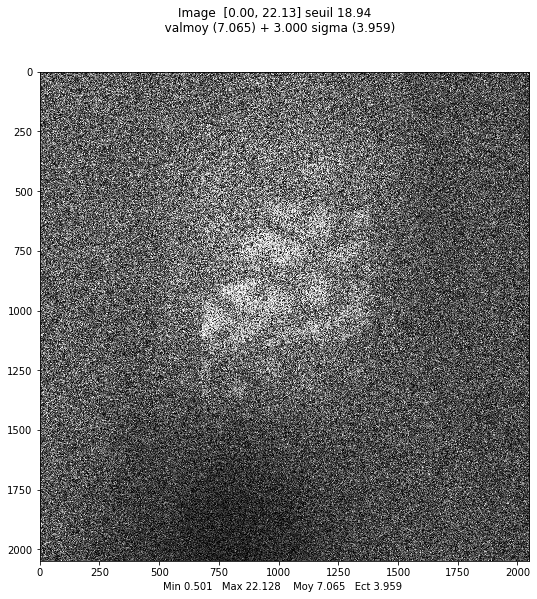

Affichage d'une image reelle
plt.show dans visusar : image 2048 x 2048


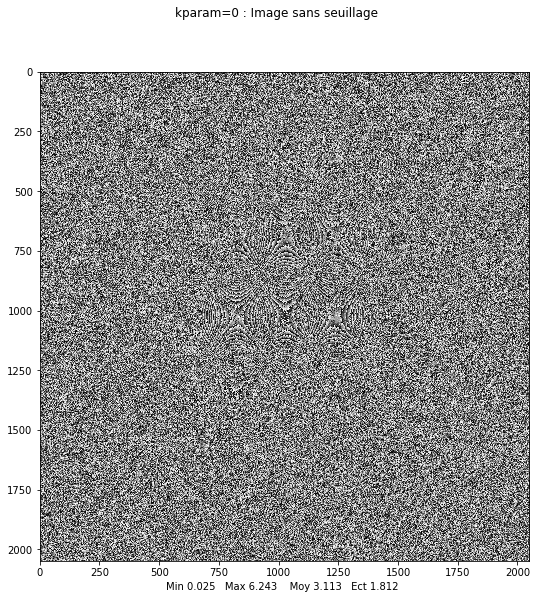

array([[3.47454337, 4.36377212, 4.4642904 , ..., 4.74287327, 3.92254649,
        3.8410527 ],
       [0.87562127, 6.09129312, 6.03490708, ..., 5.54208401, 1.52011672,
        0.62198567],
       [0.11467689, 1.06371124, 1.00498257, ..., 0.30954254, 0.79091626,
        2.45181489],
       ...,
       [0.48465788, 1.91855905, 4.10999705, ..., 0.92196798, 3.24989447,
        0.11467689],
       [1.65129197, 2.62645412, 0.97539726, ..., 3.22181909, 4.14273453,
        6.02359013],
       [3.65718215, 3.32586779, 5.10464004, ..., 0.50369004, 1.69577106,
        2.45181489]])

In [9]:
url='https://perso.telecom-paristech.fr/dalsasso/TPSAR/imagesbase/'

image_name='lausanneED.CXF'

data=mvalab.imz2mat(url+image_name)
ncol=data[1]
nlin=data[2]

image_slc = data[0]
image_amplitude = np.abs(image_slc) # COMPLETE
image_phase = np.angle(image_slc) # COMPLETE

# display amplitude
mvalab.visusar(image_amplitude)

# display phase
mvalab.visusar(image_phase+math.pi,0.)

Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre
Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre


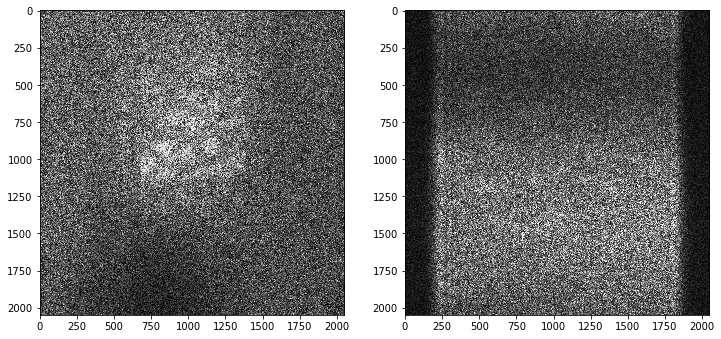

In [10]:
# Fourier spectrum
mvalab.visusarspectre(image_slc)

### Question 2.a
Where is the lake on this image ? How can we localize Lausanne city ?

### Answer 2.a

Each pixel represents several kilometers, so the image is very rough. It is very difficult to interpret this image. However, we can guess that the dark area at the bottom of the image corresponds to the lake which is smooth. The city of Lausanne corresponds to the clear area above the lake, indeed the backscatter is very strong in the city.

### Range compression (fast time)
The raw data need to be compressed along the range direction using a matched filter. 
The chirp is given and corresponds to the emitted wave of ERS sensor. The matched filter is a temporal convolution 
or equivalently a multiplication of the Fourier transforms. 


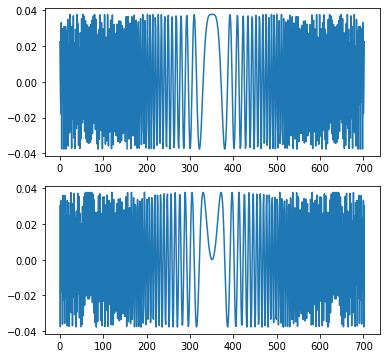

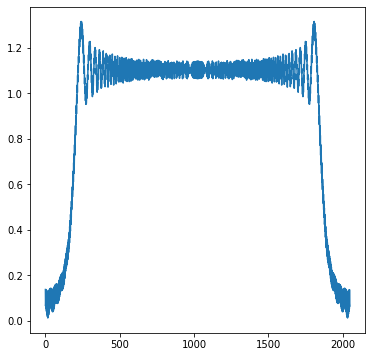

Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre
Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre


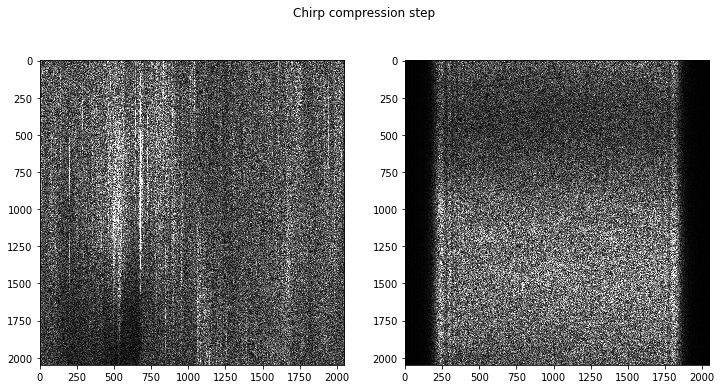

In [11]:
sigchirp=mvalab.chirp_ers()   #Warning only 703 points to encode the chirp
nsig=np.size(sigchirp) # number of points
K=4.1889e+11

#display of the chirp (real and imaginary parts)
plt.rcParams['figure.figsize'] = [6, 6]
plt.figure()
plt.subplot(211)
plt.plot(np.real(sigchirp))
plt.subplot(212)
plt.plot(np.imag(sigchirp))
plt.show()

# display of the Fouriertransform of the chirp
##%%%
line_chirp=np.zeros(ncol,dtype=complex)
line_chirp[0:nsig]=sigchirp # padding
tfchirp=np.fft.fft(line_chirp)
plt.figure()
plt.plot(np.abs(np.fft.fftshift(tfchirp))) # center the chirp on 0[Hz]
plt.show()

# range compression done in the Fourier transform line by line by FT multiplication
#to be completed 
fft1imagearray=np.fft.fft(image_slc,axis=1) # 1-D Fourier transform
fft2imagearray=np.zeros((nlin,ncol),dtype=complex)
for iut in range(nlin):
    fft2imagearray[iut,:] = np.multiply(fft1imagearray[iut,:], np.conj(tfchirp)) # COMPLETE to apply chirp compression

newimage=np.fft.ifft(fft2imagearray,axis=1)
mvalab.visusarspectre(newimage,u'Chirp compression step')


### Question 2.b
What is the effect of the chirp convolution in the range direction ? 

### Answer 2.b

We see that the Fourier transform corresponds to a gate, because we seek to focus the frequency information around the central frequency. We concentrate the information by convolving the chirp in the range direction. Some bright lines were previously spread out.

### Azimuth compression (slow time) - approximation
We are now interested in the synthetic aperture computation in the azimuth direction. Two different compression techniques will be analysed in the following cells.
First, the synthesis is done very approximately by just adding the complex signals in column (azimuth) without doing the phase correction. 
Compute a simple column convolution with a chosen size (30, 50 70 pixels for instance). 

Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre
Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre


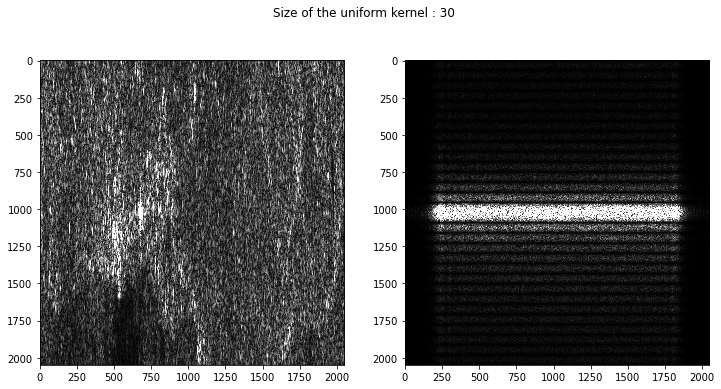

In [12]:
#########################################################################
##############  SYNTHESIS
############## constant kernel
## 

#choose the window width to do the azimuth processing 
width = 30 #in pixel # COMPLETE
#create a mask of values 1 with np.ones()
mask= np.ones((width)) # COMPLETE
newimage_step1=np.zeros( (nlin,ncol),dtype=complex)
#do the convolution with the mask in azimuth direction - to keep the same size use mode='same'
for jut in range(ncol):
    newimage_step1[:,jut] = np.convolve(newimage[:,jut], mask, mode='same')# COMPLETE
mytitle=u'Size of the uniform kernel : %d'%width
mvalab.visusarspectre(newimage_step1,mytitle) # COMPLETE to visualize the synthetized image


### Question 2.c

What is the effect of the constant kernel convolution in the azimuth direction ? 

### Answer 2.c

This first kernel convolution allows to focus the bright and dark points. The objects that were spread over a column are focused on a few particular pixels. This first approximate transformation already allows to obtain more precise results

### Azimuth compression (slow time) - synthetic aperture 
In this part, we will perform the real aperture synthesis. 
To do so, we will first compute the distance $R(y)$ from the sensor to each pixel considered along the azimuth direction denoted by $y$. This distance is given by:
$$
R(y) = R_0+\frac{y^2}{2R_0}
$$
where $R_0=R(y=0)$ corresponds to the point of closest approach (PCA). This distance is then converted in a per-pixel phase shift $\phi(y)$:
$$ 
\phi(y)=\frac{4\pi R(y)}{\lambda}=\frac{2\pi y^2}{\lambda R_0}+\text{cst}
$$

The instantaneous frequency can be derived as follows:
$$
f(y)=\frac{1}{2\pi}\frac{d\phi(y)}{dy}=\frac{2}{\lambda}\frac{dR(y)}{dy}=\frac{2y}{\lambda R_0}
$$

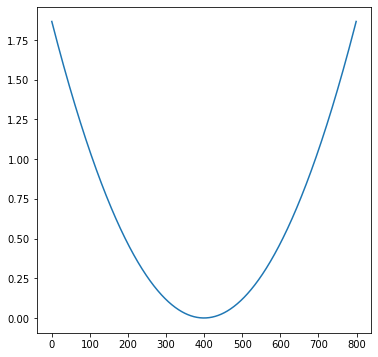

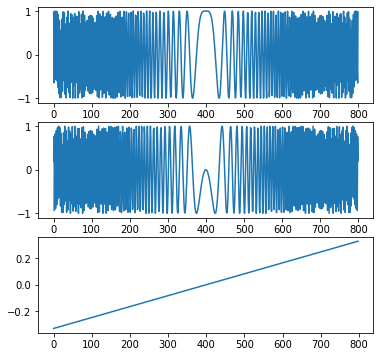

Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre
Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre


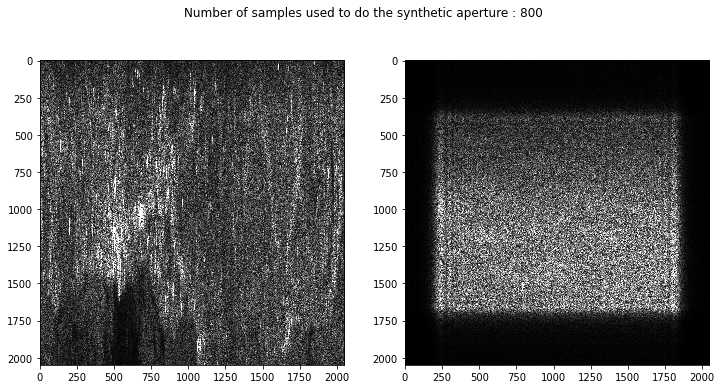

Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre
Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre


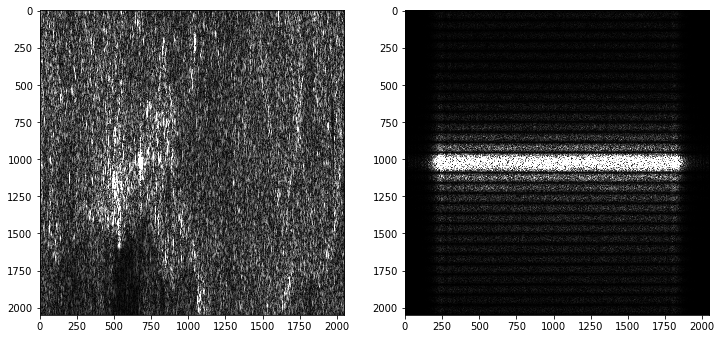

Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre
Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre


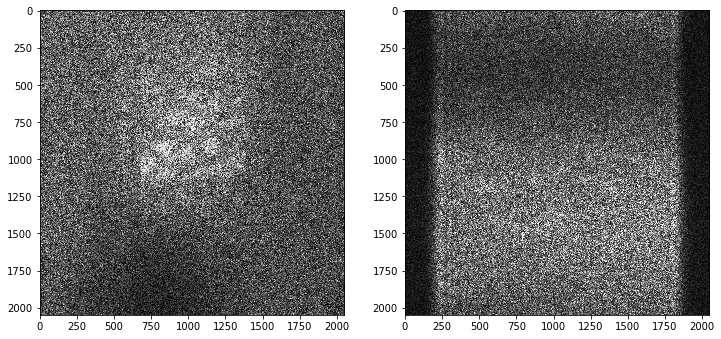

In [13]:

##############  SYNTHESIS
##############  Modulated window
#%%%
#  We use a fixed length for the synthesis (=fixed number of samples - no range migration correction)
lambda_wave = 3./53. # [cm]
prf=1679.902 #theoretical PRF of ERS-1 (PRF = Pulse Repetition Frequency)
satellite_speed=7460 # [m/s]

# dsatel: distance from the sensor to the Earth for an incidence angle of 24 degrees (considered as constant in the swath here) 
# It corresponds to PCA = Point of Closest Approach
dsatel=845000

# convert the sampling rate into the distance along the flight direction between samples 
# deltay is the distance along the azimuth between subsequent pulses 
deltay=satellite_speed/prf

#chosen number of points for the synthetic aperture synthesis 
window_size=800
NN=int(0.5*window_size) # goes from -NN to +NN, i.e. from -400 to 400

# computation of the phase ramp and complex exponential 
# replacing the "natural window" with weight 1

# convert the number of samples into a distance measured in [m]
# knowing that the distance between two samples is defined as deltay
# vector_positions corresponds to y
vector_positions = deltay*np.linspace(-NN,NN,window_size) #returns 800 evenly spaced points between -400 and 400

# vector_pca contains a vector of the pca distances
vector_pca=dsatel*np.ones(window_size) 
#vector encoding the R0. For each deltay we can compute the distance between the target and the satellite

# For each sample, compute the distance between the sensor and the target
# vector_R corresponds to R(y) 
vector_R= np.sqrt(vector_pca**2+vector_positions**2)# COMPLETE using Pythagoras' theorem

# compute in vector_R_diff the difference between vector_R and vector_pca corresponding to the distance difference w.r.t. R(0)
vector_R_diff = vector_R - vector_pca # COMPLETE

# check you obtain a quadratic contribution 
plt.figure()
plt.plot(vector_R_diff)
plt.show()

# convert the distance to the sensor in a phase contribution using phi=(4piR)/lambda
# a factor 2 for return trip (two ways)
vector_phi = (4*np.pi*vector_R_diff)/lambda_wave # vector_R_diff ou vector_R       

#convert the phase in the complex exponential contribution (phase ramp)
vector_ramp = np.exp(-1j*vector_phi) # COMPLETE

# check the instant frequency is linear: f = 1/(2pi)*d(phi)
fd = 2/lambda_wave*np.diff(vector_R) #instant frequency, equal to fd = 1/(2*np.pi)*np.diff(vector_phi)
plt.figure()
plt.subplot(311)
plt.plot(np.real(vector_ramp))
plt.subplot(312)
plt.plot(np.imag(vector_ramp))
plt.subplot(313)
plt.plot(fd)
plt.show()

######################### Warning : use the image newimage after chirp compression in distance

newimage_foc=np.zeros( (nlin,ncol),dtype=complex)
#do the matched filter by azimuth convolution with mode='same'
for jut in range(ncol):
    newimage_foc[:,jut]= np.convolve(newimage[:,jut],np.conj(vector_ramp),mode='same') # COMPLETE

#display the synthetized image
mytitle=u'Number of samples used to do the synthetic aperture : %d'%window_size
mvalab.visusarspectre(newimage_foc, mytitle) # COMPLETE
#display the image after azimuth synthesis using a square window (previous question)
mvalab.visusarspectre(newimage_step1)
#disaply the original image 
mvalab.visusarspectre(image_slc)


### Question 2.d
Compare the synthesized image with the mean kernel and the one taking into account the phase variation due to the distance. Compare the image obtained after synthesis in range and azimuth direction and the original image.

### Answer 2.d

The image taking into account the phase variations allows to localize the information even better. But if the light points are better localized, the image remains noisy and difficult to interpret. When we compare the original image to our final image, we have gained in resolution.

### Azimuth multi_looking
The size of the SLC pixel for ERS-1 are 3m in azimuth and 12m in range. 
To obtain square pixels, a simple processing is averaging amplitude values 
and then do an undersampling with a factor of 4. 
It is even better to do the averaging on intensity values (square of the modulus) 
and then take the square root. 
Do you recognize Lausanne on this image ? (use google maps to have an optical view). 

Affichage d'une image complexe : on prend le module
plt.show dans visusar : image 2048 x 512


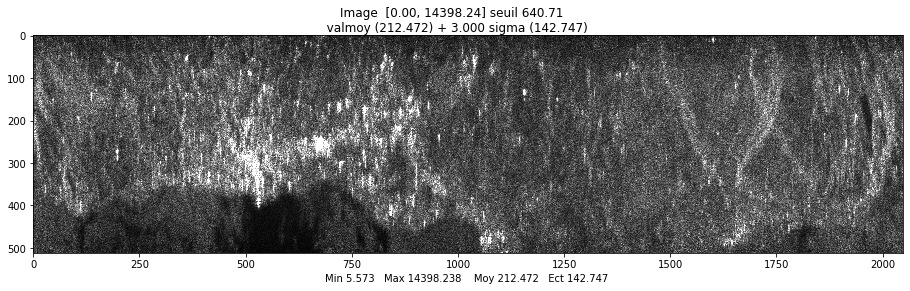

array([[ 81.07751915,  78.05484671, 161.77151492, ...,  45.67083403,
        118.23099753, 131.16775541],
       [129.48300469, 111.77658972, 146.49316002, ..., 201.21719186,
        133.78252815, 129.30677633],
       [ 59.6711362 , 150.7551348 ,  67.33170529, ..., 125.57634318,
        111.82875459,  28.74509033],
       ...,
       [104.97564536, 140.84203879, 169.59016799, ...,  70.11253557,
        165.71976333, 135.90363131],
       [198.09894478, 154.10725804,  80.57366857, ..., 106.69242651,
        151.27869853,  90.50866416],
       [116.50308137, 165.5499483 ,  96.81961427, ..., 125.45404636,
        166.91335453, 199.89143091]])

In [15]:
#define a vertical mask to do the convolution
mask_vertical = np.ones((4,1))/4 # COMPLETE

#do the convolution on the intensity image obtained by z.z* (=|z|²)
#you will get the multi-looked image in intensity ml_int
ml_int = scipy.signal.convolve2d(np.multiply(newimage_foc,np.conj(newimage_foc)),mask_vertical,mode='same') # COMPLETE

#do the sub-sampling to obtain square pixels with improved radiometry
ml_int_sub = ml_int[::4,:] # COMPLETE

plt.rcParams['figure.figsize'] = [16, 4]
#take the square root of the intensity to have an amplitude image (proportional to |z|)
mvalab.visusar(np.sqrt(ml_int_sub))

### Question 2.e
What is the effect of multi-looking ? Is this image well oriented compared to a map ? Use the Lac de Bret to check this point. 

### Answer 2.e

The city is more recognizable once the vertical averaging and subsampling is done, the pixels are square. The lake is at the bottom left, and the city of Lausanne above. On the top right we see a dark spot corresponding to the lake of Bret. The image is oriented in the same direction as Google Maps, because the lake of Bret is well on the left of Lausanne.

## Example of a High Resolution image 
The obtained image after chirp compression and synthetic aperture processing is still difficult to understand because of the coarse resolution of ERS. 
To illustrate these processing on a more impressive case, you can apply the following functions. Basically it is the same as before, but with dedicated chirp and distance computations. 
WARNING: the range and azimuth are not the usual one (vertical = range direction, horizontal = azimuth direction).

In [16]:
#example on the aerial image 
from google_drive_downloader import GoogleDriveDownloader as gdd
gdd.download_file_from_google_drive(file_id='1vR2m7Lb2aI6Dhak4u9eR2ZPGYhasmCO5',
                                    dest_path='./HighRes.zip',
                                    unzip=True)
import sys
sys.path.append('./HighRes/')

Unzipping...Done.


Affichage d'une image complexe : on prend le module
plt.show dans visusar : image 2250 x 1200


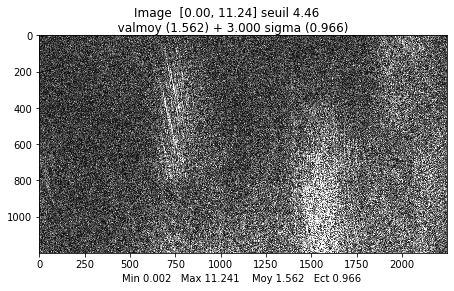

Affichage d'une image complexe : on prend le module
plt.show dans visusar : image 2250 x 1200


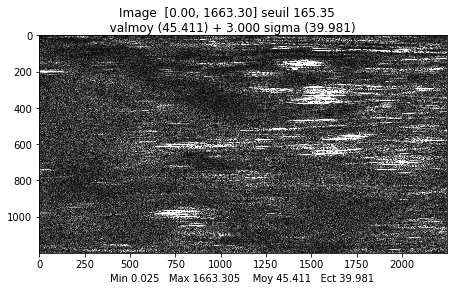

array([[ 18.03237739,  28.44279999,  18.96079928, ..., 135.95170921,
         57.4814084 ,  39.67226031],
       [  5.83125088,  11.05115775,   8.56496252, ...,  54.75190213,
         46.32013823,  55.88545038],
       [ 38.47776521,  31.3947608 ,  32.17694149, ...,  24.02322788,
         36.27371087,  43.43921816],
       ...,
       [ 42.30617416,  56.44313865,  25.59774516, ...,  74.38811496,
         77.96074147,  53.60042357],
       [ 33.61096506,  20.30809435,  26.04900335, ...,  42.32772338,
         58.05189412,  73.34537249],
       [  9.76484863,  17.36589467,  21.03941096, ...,  23.97604713,
         24.30031758,  55.95709109]])

In [17]:
# mvalab.synthese_range reads the matrix containing the raw data and the system 
#parameters and compute the synthesis in the range direction
raw_data, range_compressed_data = mvalab.synthese_range('./HighRes/data2.mat')
mvalab.visusar(raw_data) 
mvalab.visusar(range_compressed_data)

Affichage d'une image complexe : on prend le module
plt.show dans visusar : image 2250 x 1200


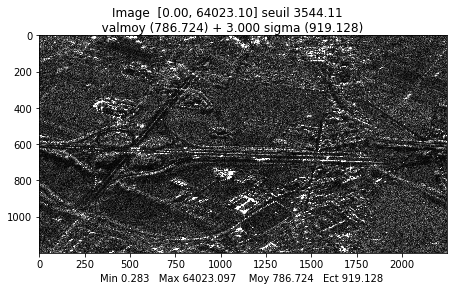

array([[ 775.32742371, 1070.56841348, 1469.26323321, ...,  164.55484113,
         514.62517401,  427.66137765],
       [ 677.70931253,  431.36012305,  838.69135038, ..., 1269.73532587,
        1090.82304468,  572.09033222],
       [ 743.29372446,  555.70935025,   74.25669759, ..., 1029.42988341,
        1586.86706598, 1527.37271959],
       ...,
       [ 887.36243869,  276.56204519,  596.94952325, ..., 1633.04809556,
         665.0517977 ,  692.46505559],
       [ 694.19071614,  675.65374316,  842.70309814, ..., 1344.04207988,
         374.60029968,  836.25887243],
       [ 617.6511821 , 1035.61133022, 1350.51800554, ...,  707.91522889,
         790.59286883,  825.79869417]])

In [18]:
#mvalab.synthese_azimuth takes the range compressed image and does the azimuth compression step
compressed_data = mvalab.synthese_azimuth(range_compressed_data, './HighRes/data2.mat')
mvalab.visusar(compressed_data)

## (Bonus) Part 3: Sub aperture analysis
Let us go back to the understanding of the complex spectrum information. 
Indeed, both axes of the complex Fourier transform of a Single look Complex image are related to SAR synthesis: the range (horizontal) axis is related to the chirp frequencies, and the azimuth (vertical) axis is related to the sensor positions during the Synthetic Aperture synthesis. 
The target is observed by the radar for a time corresponding to the observation time. Therefore, each frequency carries information about the observed target. We can see this in the following example, where we are going to consider only a sub part of the synthetic aperture of the radar

### Sub-aperture on TerraSAR-X image of Paris 
In the Fourier spectrum, select in azimuth (vertical positions in the spectrum) a sub-window called sub-aperture, then do zero-padding for the remaining part of the spectrum and compute the inverse Fourier transform. 

To understand the effects of sub-aperture decomposition, select a sub-aperture and synthesize different images for different selected bands.

Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre
Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre


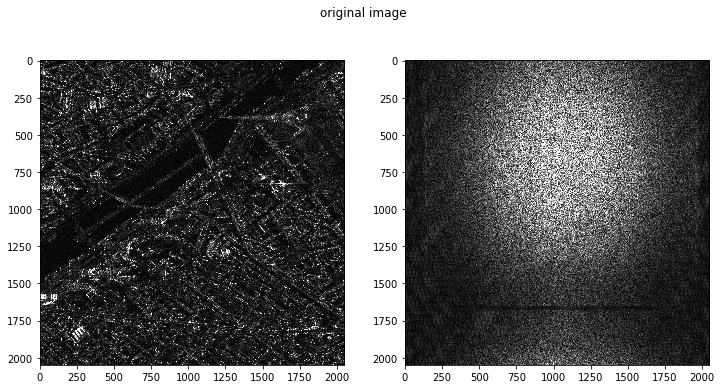

Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre
Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre


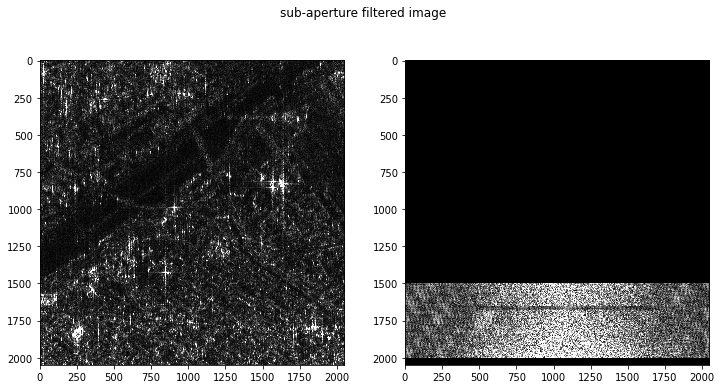

In [19]:
# sub-aperture using the spectrum of the synthesized image - PARIS

mvalab.visusarspectre(image_slc_paris,'original image')
imafft=np.fft.fftshift(np.fft.fft2(image_slc_paris))
nlin = data_paris[1]
ncol = data_paris[2]

#take some values for the selected frequencies and study some specific strong targets 
f1 = 1500
df = 500
ima_subband_fft=np.zeros((nlin,ncol),dtype=complex)
ima_subband_fft[f1:f1+df,:] = imafft[f1:f1+df,:] # COMPLETE 

ima_subband=np.fft.ifft2(np.fft.fftshift(ima_subband_fft))
mvalab.visusarspectre(ima_subband,'sub-aperture filtered image')

Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre
Affichage d'une image complexe : on prend le module
Visusar sans plt.show, ni titre


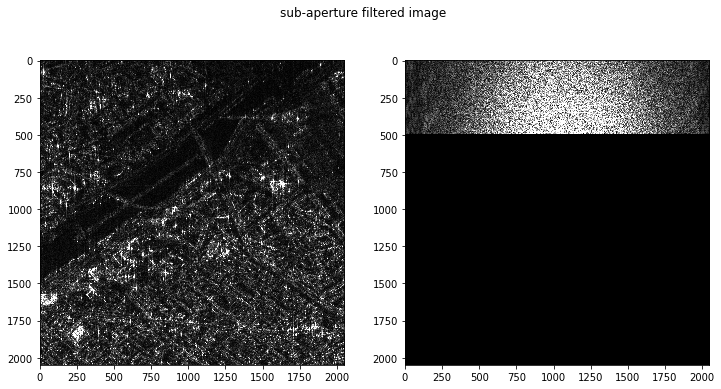

In [27]:
f1 = 00
df = 500
ima_subband_fft=np.zeros((nlin,ncol),dtype=complex)
ima_subband_fft[f1:f1+df,:] = imafft[f1:f1+df,:] # COMPLETE 

ima_subband=np.fft.ifft2(np.fft.fftshift(ima_subband_fft))
mvalab.visusarspectre(ima_subband,'sub-aperture filtered image')

### Bonus: Question 3.a
Choose different values for $f_1$ and $d_f$. Comment the images you see: what is the influence of these parameters on the type of reflection you see and on the resolution? 

Observe some bright scatterers and see how they vary in the different sub-parture selections. How can you explain the variations of the backscattered signals for the different sub-apertures ? 



### Bonus: Answer 3.a

If f1 is high, the scatters are very bright (forming little cross of light), and it affects the resolution, the image seems blurry.

 With a lower f1, these bright point are less luminous. 